In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from SSG import SSG

In [3]:
log_returns_corr_matrix = pd.read_excel('/Users/goshabor/NTNU/10.Semester/TMA4900 – Industriell matematikk, masteroppgave/Code/Experiment 2 – Calibration/SMI/FFTResults/CalibrationResults/corr_matrix.xlsx')
log_returns_corr_matrix = log_returns_corr_matrix.to_numpy(dtype=float)

FFT_estimates = pd.read_excel('/Users/goshabor/NTNU/10.Semester/TMA4900 – Industriell matematikk, masteroppgave/Code/Experiment 2 – Calibration/SMI/FFTResults/CalibrationResults/FFT_estimates.xlsx')

portfolio_weights_df = pd.read_excel('/Users/goshabor/NTNU/10.Semester/TMA4900 – Industriell matematikk, masteroppgave/Code/Experiment 2 – Calibration/SMI/FFTResults/CalibrationResults/pfolio_weights.xlsx')
portfolio_weights_df = portfolio_weights_df[portfolio_weights_df['TKR']!='Cash']
portfolio_weights_df['w'] = portfolio_weights_df['w']/100

df = pd.merge(FFT_estimates, portfolio_weights_df, on='TKR', how='outer')
df

,TKR,S0,r,mu,mu_uncapped,mu_Q,C,G,M,sigma,theta,nu,w,w_alt
0,ABB,82.86,-0.0004,0.127094,0.184898,-0.012319,12.028845,12.968054,21.431640,0.294213,-0.366309,0.083134,0.0758,15.00
1,ALCC,49.61,-0.0004,-0.083546,-0.083546,-0.006060,11.271924,14.032037,21.542191,0.273092,-0.280050,0.088716,0.0222,1.83
2,CFR,156.55,-0.0004,0.000324,0.080265,-0.021527,106.265383,48.271206,48.273558,0.302004,-0.000107,0.009410,0.0552,2.18
3,GALD,158.35,-0.0004,0.187403,0.246114,-0.004830,27.445113,17.934348,40.144548,0.276116,-0.846653,0.036436,0.0181,20.26
4,GEBN,503.40,-0.0004,-0.006973,-0.006973,-0.026565,88.253821,58.969168,65.840212,0.213218,-0.156185,0.011331,0.0132,0.99
5,GIVN,2683.00,-0.0004,-0.058919,-0.058919,-0.028390,2.618908,5.165600,15.376532,0.256794,-0.336672,0.381838,0.0188,0.00
6,HOLN,76.26,-0.0004,0.133587,0.195023,-0.046450,20.039086,20.850715,30.237841,0.252126,-0.298359,0.049902,0.0247,12.98
7,LONN,474.20,-0.0004,0.011345,0.011345,-0.013668,17.456671,17.845342,25.153005,0.278893,-0.284201,0.057285,0.0261,6.43
8,NESN,76.88,-0.0004,-0.034524,-0.034524,-0.042247,12.186183,19.116281,37.332470,0.184801,-0.311054,0.082060,0.1505,1.36
9,NOVN,116.80,-0.0004,0.061636,0.078652,-0.034462,54.732930,45.214604,57.048538,0.206005,-0.251105,0.018271,0.1712,1.28


In [4]:
T = 1.0
N_t = int(252)
N_MC = 20
dt = T/N_t

d = len(df)

tickers = df['TKR'].astype(str).to_list()
S0_vec = df['S0'].astype(float).to_numpy()
mu_vec = df['mu'].astype(float).to_numpy()
VG_params = df[['sigma', 'theta', 'nu']].astype(float).to_numpy()

sigma_vec = VG_params[:,0]
theta_vec = VG_params[:,1]
nu_vec = VG_params[:,2]

pfolio_value = 50000
risky_portfolio_value = float(df['w'].sum())*pfolio_value
cash = pfolio_value - risky_portfolio_value

value_per_asset = risky_portfolio_value * df['w'].to_numpy(dtype=float)
h0 = (value_per_asset/np.asarray(S0_vec, dtype=float)).tolist()

print(f'Initial cash: {cash}')
print(f'Initial holdings: {h0}')
print(f'Risky portfolio value: {risky_portfolio_value}')

Initial cash: 69.99999999999272
Initial holdings: [45.675766352884395, 22.343196936101595, 17.605467901628874, 5.707186611935587, 1.3092491060786655, 0.3498635855385762, 16.171924993443486, 2.7481505693800083, 97.74278095733612, 73.1850684931507, 0.7854538252602988, 26.197646875000004, 0.9499955752212391, 14.589935064935064, 6.2500944733112895, 5.278162468960626, 1.078955348615091, 12.539974884889075, 98.15063500828273, 5.6315364120781535]
Risky portfolio value: 49930.00000000001


In [6]:
simulator = SSG(S0_vec=S0_vec, mu_vec=mu_vec, sigma_vec=sigma_vec, theta_vec=theta_vec, nu_vec=nu_vec, log_returns_corr_matrix=log_returns_corr_matrix, T=T, N_t=N_t, N_MC=N_MC)
S = simulator.simulate_stock_price_process()
S_mean = S.mean(axis=0)
time_grid = np.linspace(0,1,N_t+1)

plots_per_fig = 21
nrows, ncols = 5, 4

for fig_idx, start in enumerate(range(0, len(tickers), plots_per_fig), start=1):
    end = min(start + plots_per_fig, len(tickers))

    fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 30), constrained_layout=True, dpi=600, squeeze=False)
    ax = ax.ravel()
    for j, i in enumerate(range(start, end)):
        ticker = tickers[i]

        ax[j].plot(time_grid, S_mean[:, i])
        ax[j].set_title(ticker, fontsize=18)
        ax[j].grid(True)
        ax[j].set_xlabel("Time (years)", fontsize=18)
        ax[j].set_ylabel("Price (CHF)", fontsize=18)
        ax[j].tick_params(axis="both", labelsize=15)

    for k in range(end - start, len(ax)):
        ax[k].set_visible(False)

    plt.show()

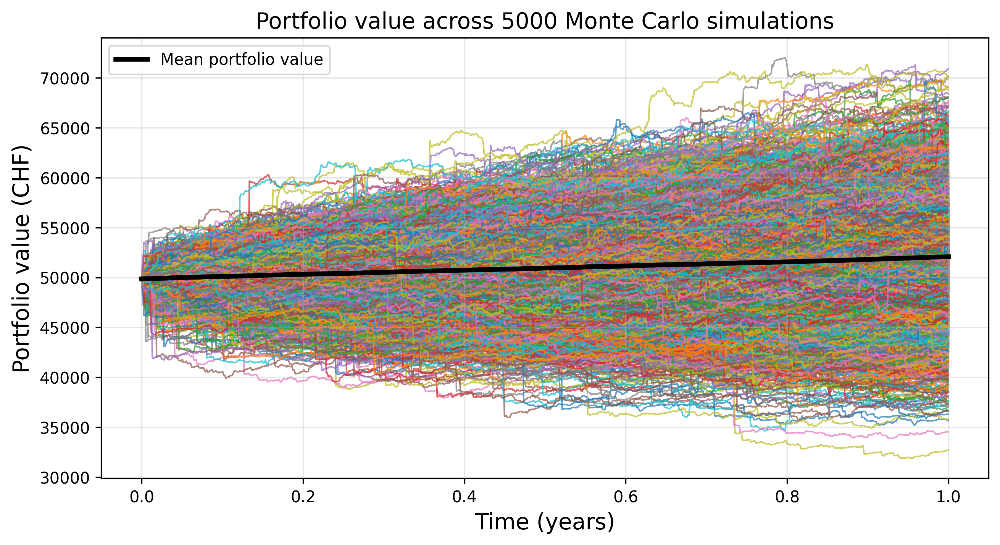

In [6]:
N_MC = 5000

simulator = SSG(S0_vec=S0_vec, mu_vec=mu_vec, sigma_vec=sigma_vec, theta_vec=theta_vec, nu_vec=nu_vec, log_returns_corr_matrix=log_returns_corr_matrix, T=T, N_t=N_t, N_MC=N_MC)
S = simulator.simulate_stock_price_process()
S_mean = S.mean(axis=0)

portfolio_values = (S * h0).sum(axis=2)
mean_path = portfolio_values.mean(axis=0)

plt.figure(figsize=(10, 5), dpi=300)
for m in range(portfolio_values.shape[0]):
    plt.plot(time_grid, portfolio_values[m], alpha=0.7, linewidth=1, zorder=1)
plt.plot(time_grid, mean_path, color="black", linewidth=3, label="Mean portfolio value", zorder=3)

plt.xlabel('Time (years)', fontsize=14)
plt.ylabel("Portfolio value (CHF)", fontsize=14)
plt.title(f"Portfolio value across {N_MC} Monte Carlo simulations", fontsize=14)
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

In [7]:
mean_path[-1]

np.float64(52070.67603388124)

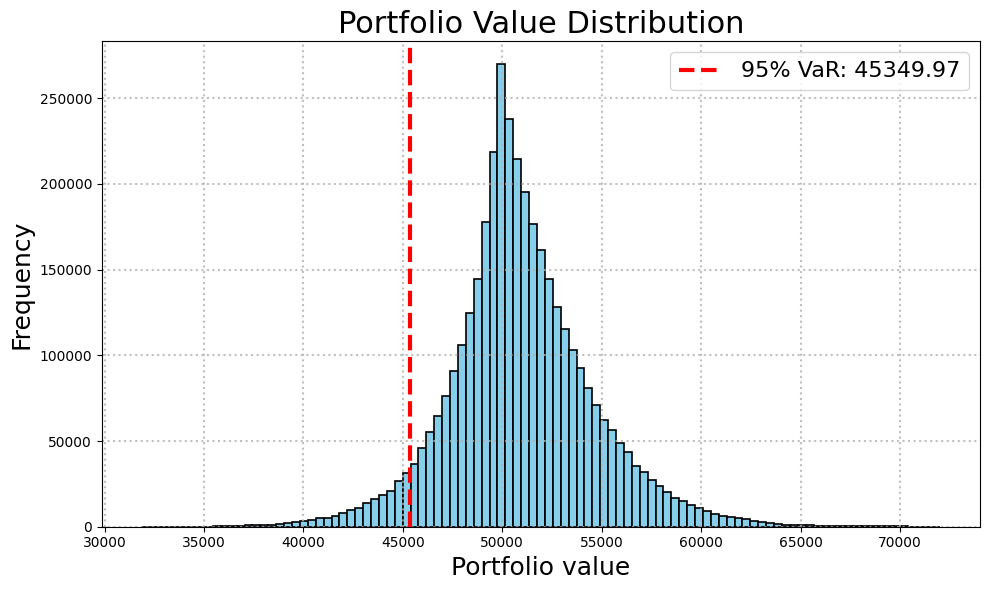

In [8]:
var_95 = np.percentile(portfolio_values, 5)
plt.figure(figsize=(10, 6))

plt.hist(
    portfolio_values.flatten(), 
    bins=101,
    color="skyblue",
    edgecolor="black",
    linewidth=1.2
)

plt.axvline(
    var_95,
    color="red",
    linestyle="--",
    linewidth=3,
    label=f"95% VaR: {var_95:.2f}"
)

plt.xlabel("Portfolio value", fontsize=18)
plt.ylabel("Frequency", fontsize=18)
plt.title("Portfolio Value Distribution", fontsize=22)

plt.legend(fontsize=16)
plt.grid(True, linestyle=":", linewidth=1.5, alpha=0.8)

plt.tight_layout()
plt.show()

In [9]:
var_95

np.float64(45349.96769324106)

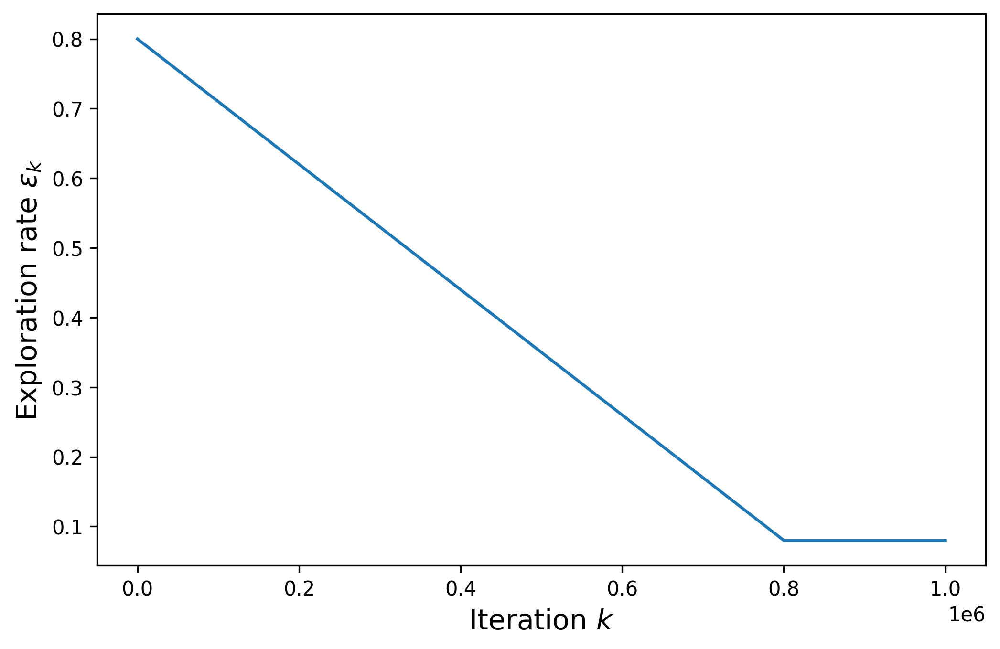

In [31]:
eps_min = 0.08
eps_max = 0.8
N_iter = 1_000_000

eps_arr = np.array([eps_max - min(1, k/max(1, 0.8*N_iter))*(eps_max-eps_min) for k in range(1, N_iter+1)])

plt.figure(figsize=(8,5), dpi=300)
plt.plot(eps_arr)
#plt.title(r'Exploration rate per iteration', fontsize=14)
plt.xlabel(r'Iteration $k$', fontsize=14)
plt.ylabel(r'Exploration rate $\varepsilon_k$', fontsize=14)
plt.show()